In [1]:
from arpes.io import load_data
import os.path

C:\Users\hellbrue\Documents\Repositories\pyarpes\arpes\config.py:54: UserWarning: Could not find local configuration file. If you don't have one, you can safely ignore this message.
  warnings.warn(msg)


Activating auto-logging. Current session state plus future input saved.
Filename       : logs\unnamed_2022-12-13_11-45-24.log
Mode           : backup
Output logging : False
Raw input log  : False
Timestamping   : False
State          : active


In [4]:
# Define directory
path = os.path.abspath("G:\My Drive\Bi2223\e19557\Box_1_square_renamed")

# Different parameters used to set up scans at SLS
scan_type = 'FS'
direction = 'AN'
phi = 'P95'
energy = '*'
polarization = '*'
temp = 'LT'
e_pass = '*'+'eVpass'
comment = ''
run = '*'.zfill(4)

# Put together string for finding file
parameters = [scan_type, direction, phi, energy, polarization, temp, e_pass, comment, run]
if comment == '':
    parameters.remove(comment)
file_type = 'h5'
file_name = '_'.join(parameters)
file = '.'.join([file_name , file_type])

full_file = os.path.join(path, file)
file

'FS_AN_P95_*_*_LT_*eVpass_000*.h5'

In [5]:
import glob
# Load all files with above specified parameters, * is a placeholder and imports all files in its place
files = glob.glob(full_file)
print(len(files))
files

1


['G:\\My Drive\\Bi2223\\e19557\\Box_1_square_renamed\\FS_AN_P95_25eV_CIRCP_LT_5eVpass_0000.h5']

In [98]:
data_list = {}
for file in files:
    #data_list.append(load_data(file, location="ULTRA"))
    data = load_data(file, location="ULTRA")
    file_name = file.replace(path, '')[1:-3]
    data_list.update({file_name : data})

In [7]:
fs_data = load_data(file, location="ULTRA")

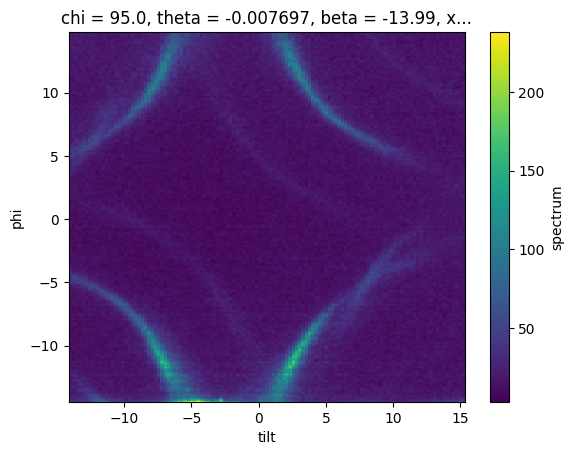

In [91]:
%matplotlib inline
import matplotlib.pyplot as plt
fs_data.spectrum.sel(eV=slice(-0.02,0.02)).sum("eV").plot()

plt.savefig('Plots/FS_AN_P95_25eV_CIRCP_LT_5eVpass_0000/FS_snap.png')

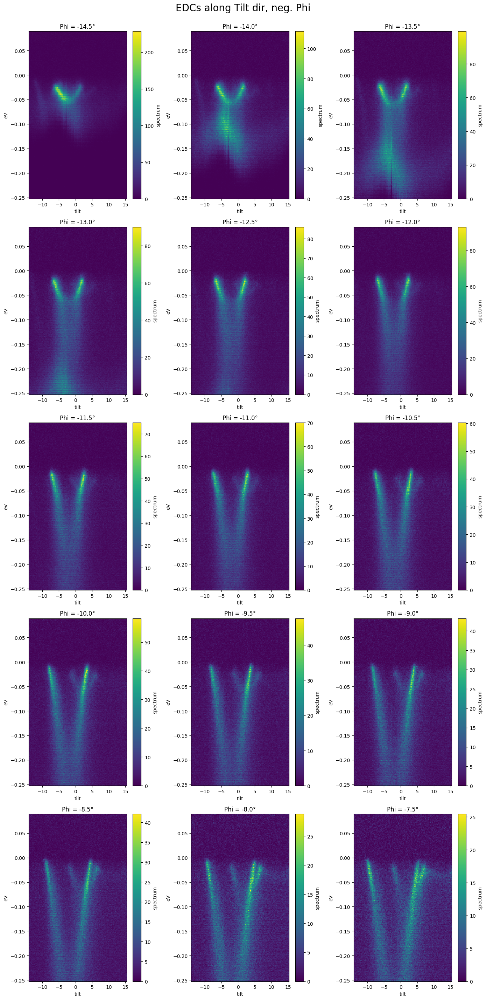

In [93]:
import numpy as np
import math
angles = np.arange(-14.5, -7, 0.5)
# print(angles)
rows = math.ceil(len(angles) / 3)
fig, ax = plt.subplots(rows, 3, figsize=(14, 6*rows))
fig.suptitle('EDCs along Tilt dir, neg. Phi', fontsize=20)

for k in angles:
    edc = fs_data.spectrum.sel(phi=slice(k,k+0.5)).sum("phi")
    edc.plot(ax=ax.ravel()[list(angles).index(k)])
    ax.ravel()[list(angles).index(k)].set_title(f"Phi = {k}°")
    
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.savefig('Plots/FS_AN_P95_25eV_CIRCP_LT_5eVpass_0000/neg_Phi_overview.png')

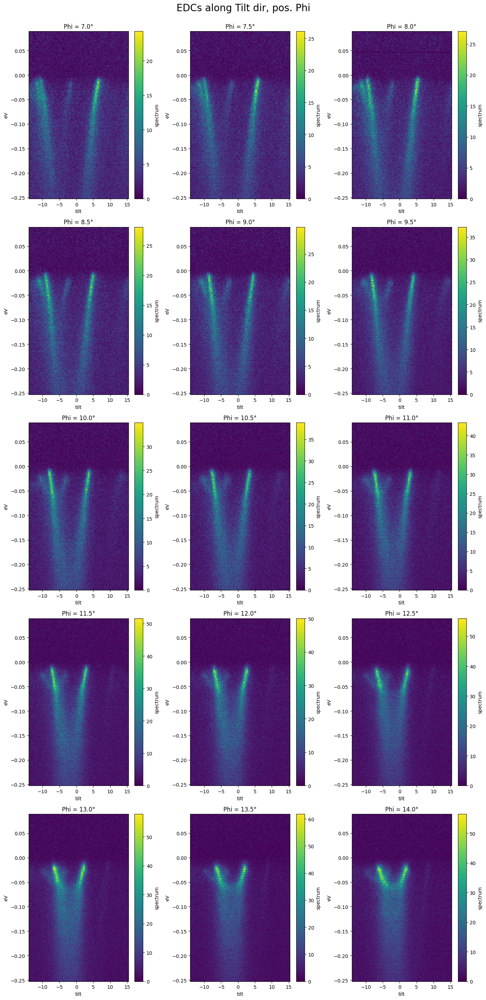

In [95]:
angles = np.arange(7, 14.5, 0.5)
# print(angles)
rows = math.ceil(len(angles) / 3)
fig, ax = plt.subplots(rows, 3, figsize=(14, 6*rows))
fig.suptitle('EDCs along Tilt dir, pos. Phi', fontsize=20)

for k in angles:
    edc = fs_data.spectrum.sel(phi=slice(k,k+0.5)).sum("phi")
    edc.plot(ax=ax.ravel()[list(angles).index(k)])
    ax.ravel()[list(angles).index(k)].set_title(f"Phi = {k}°")
    
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.savefig('Plots/FS_AN_P95_25eV_CIRCP_LT_5eVpass_0000/pos_Phi_overview.png')

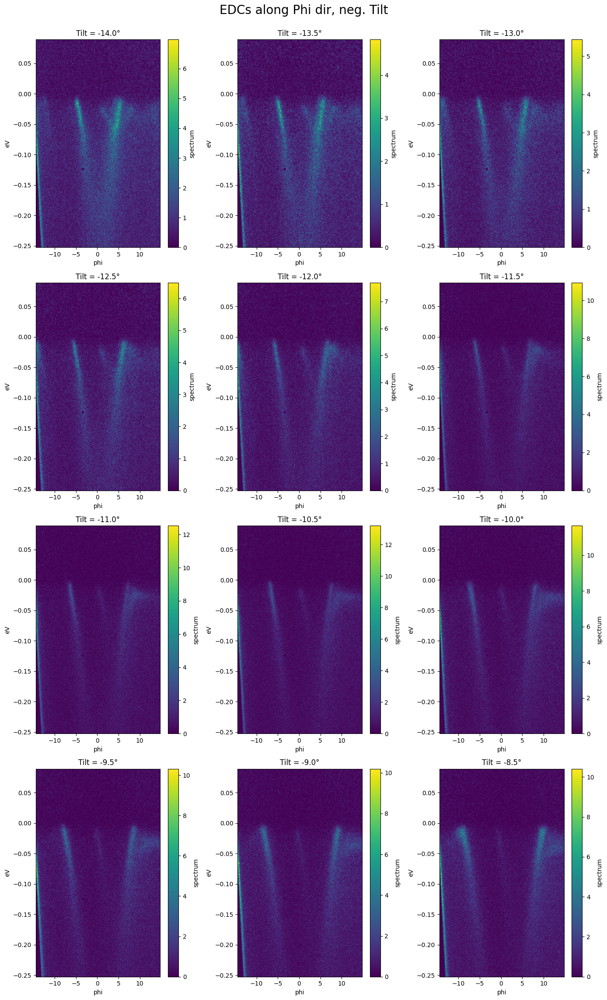

In [96]:
angles = np.arange(-14, -8, 0.5)
# print(angles)
rows = math.ceil(len(angles) / 3)
fig, ax = plt.subplots(rows, 3, figsize=(14, 6*rows))
fig.suptitle('EDCs along Phi dir, neg. Tilt', fontsize=20)

for k in angles:
    edc = fs_data.spectrum.sel(tilt=slice(k,k+0.5)).sum("tilt")
    edc.plot(ax=ax.ravel()[list(angles).index(k)])
    ax.ravel()[list(angles).index(k)].set_title(f"Tilt = {k}°")
    
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.savefig('Plots/FS_AN_P95_25eV_CIRCP_LT_5eVpass_0000/neg_Tilt_overview.png')

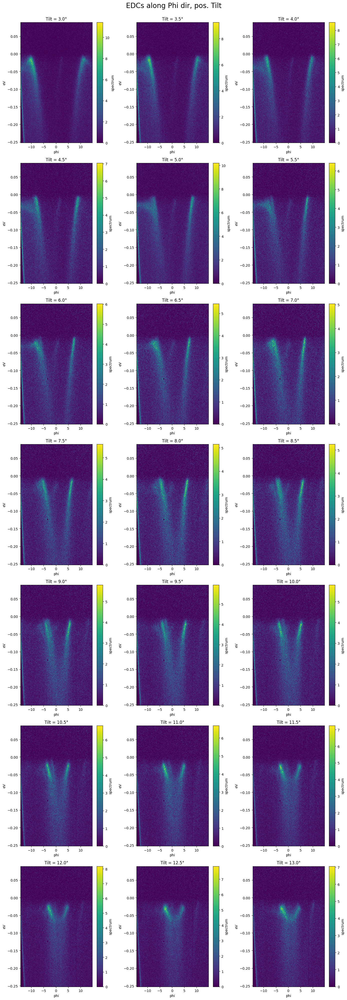

In [97]:
angles = np.arange(3, 13.5, 0.5)
# print(angles)
rows = math.ceil(len(angles) / 3)
fig, ax = plt.subplots(rows, 3, figsize=(14, 6*rows))
fig.suptitle('EDCs along Phi dir, pos. Tilt', fontsize=20)

for k in angles:
    edc = fs_data.spectrum.sel(tilt=slice(k,k+0.5)).sum("tilt")
    edc.plot(ax=ax.ravel()[list(angles).index(k)])
    ax.ravel()[list(angles).index(k)].set_title(f"Tilt = {k}°")
    
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.savefig('Plots/FS_AN_P95_25eV_CIRCP_LT_5eVpass_0000/pos_Tilt_overview.png')